# Basics

## Loading the dataset

For our tutorials we work with energy price data over the 4 years from Spain. The dataset was published on [Kaggle](https://www.kaggle.com/datasets/nicholasjhana/energy-consumption-generation-prices-and-weather) and contains a lot of information to which we will come back later. For now we use a prepared version of the dataset with the hourly energy price data only.


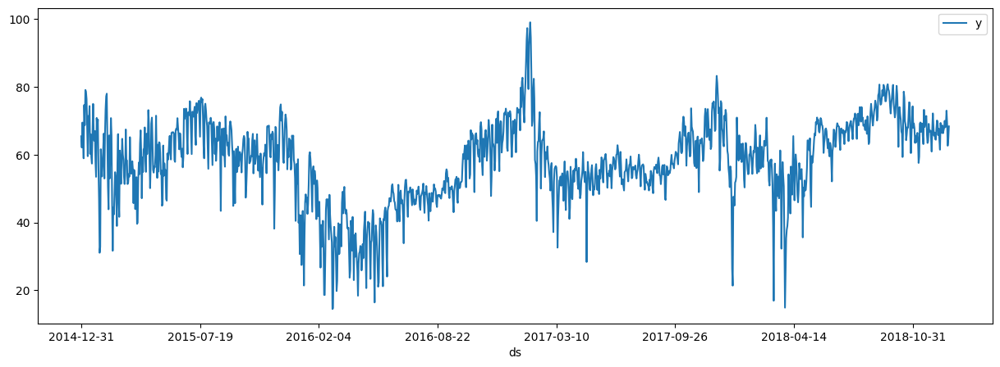

In [1]:
import pandas as pd

# Load the dataset from the CSV file using pandas
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial01.csv")
# Plot the dataset, showing price (y column) over time (ds column)
plt = df.plot(x="ds", y="y", figsize=(15, 5))


## Setting up the model

In [2]:
# ! pip install git+https://github.com/ourownstory/neural_prophet.git

In [3]:
# Import the NeuralProphet class
from neuralprophet import NeuralProphet, set_log_level

c:\Users\eagle\Documents\repo\.venv_jon_py39_new\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
c:\Users\eagle\Documents\repo\.venv_jon_py39_new\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] The specified procedure could not be found'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [4]:
# Disable logging messages unless there is an error
set_log_level("ERROR")

# Create a NeuralProphet model with default parameters
m = NeuralProphet()

# Use static plotly in notebooks
m.set_plotting_backend("plotly")

# Fit the model on the dataset (this might take a bit)
metrics = m.fit(df)


Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 313.25it/s]


Epoch 173: 100%|██████████| 173/173 [00:00<00:00, 901.11it/s, loss=0.00421, v_num=16, MAE=4.470, RMSE=6.040, Loss=0.00376, RegLoss=0.000]   


## Forecast the future

To predict future values we have to extend our dataframe. In our example we want to create a forecast of the next year (meaning 365 days). Then we have to run the prediction again on the extended dataframe.



In [5]:
# Create a new dataframe reaching 365 into the future for our forecast, n_historic_predictions also shows historic data
df_future = m.make_future_dataframe(df, n_historic_predictions=True, periods=365)

# Predict the future
forecast = m.predict(df_future)

# Visualize the forecast
m.plot(forecast)


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 302.19it/s]


The forecast is composed of the following components: trend, yearly and weekly seasonality. They are added together to create the forecast.



In [6]:
m.plot_parameters(components=["trend", "seasonality"])


# Trends

In this tutorial we will learn how to use the `Trend` component to model the trends of a time series.

We start with the same setup from the previous tutorial in terms of importing the necessary libraries and loading the data.



In [7]:
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")

# Load the dataset from the CSV file using pandas
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial01.csv")


NeuralProphet has by default the `Trend` and the `Seasonality` components enabled. In this second tutorial we will explore the `Trend` component in more detail and start with its most basic configuration. Therefore we will disable the `Seasonality` component for now and set the number of `Trend` changepoints to 0 (zero).

In [8]:
# Model and prediction
m = NeuralProphet(
    # Disable change trendpoints
    n_changepoints=0,
    # Disable seasonality components
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
)
m.set_plotting_backend("plotly")
metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 335.41it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 486.63it/s]


We already see a linear trend line in the plot which fits well to the data.

Let us explore which trends could be seen in our dataset and how our model automatically fitted to those trends. Later we look into how to fine tune the model trend parameters.



In [9]:
m.plot_components(forecast, components=["trend"])


NeuralProphet uses a classic approach to model the trend as the combination of an offset $m$ and a growth rate $k$. The trend effect at a time $t_1$ is given by multiplying the growth rate $k$ by the difference ($t_1 - t_0$) in time since the starting point $t_0$ on top of the offset $m$.

$$\text{trend}(t_1) = m + k (t_1 - t_0) = \text{trend}(t_0) + k(t_1 - t_0)$$

After learning about the theory of the trend, we use the model to predict the tend into the future and see how our trend line will continue.



In [10]:
df_future = m.make_future_dataframe(df, periods=365, n_historic_predictions=True)

# Predict the future
forecast = m.predict(df_future)

# Visualize the forecast
m.plot(forecast)

Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 285.18it/s]


The linear trend line does continue in the future. Overall there is a slight upward trend in the data.

After learning the basics of the trend in NeuralProphet, let’s look into the trend changepoints we disabled earlier. Trend changepoints are points in time where the trend changes. NeuralProphet automatically detects these changepoints and fits a new trend line to the data before and after the changepoint. Let’s see how many changepoints NeuralProphet detected.

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 299.34it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 440.93it/s]


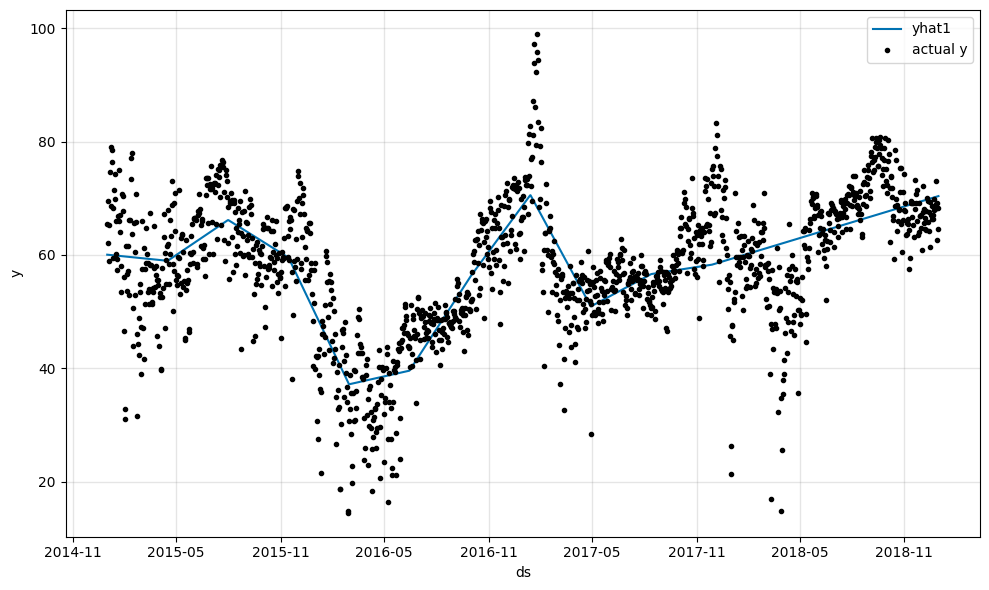

In [11]:
# Model and prediction
m = NeuralProphet(
    # Use default number of change trendpoints (10)
    # n_changepoints=0,
    # Disable seasonality components
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
)
m.set_plotting_backend("matplotlib")  # Use matplotlib due to #1235
metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

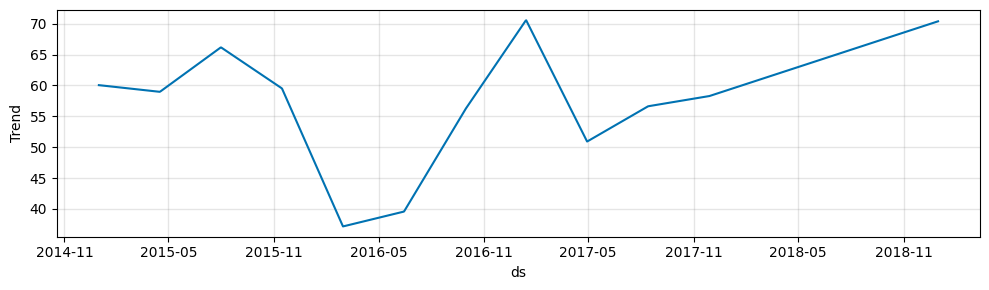

In [12]:
m.plot_parameters(components=["trend"])


# Seasonality

We will explore the seasonality component of NeuralProphet. It allows the model to capture seasonal effects, such as a positive or negative bias for a given day of the week.

In the second tutorial covering Trends, we disabled seasonality. Let us enable the seasonality step by step again, starting with the yearly seasonality. We give it a try and then see what effects it has on the model. We will keep the trend linear with no changepoints for simplicity.

In [13]:
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")

# Load the dataset from the CSV file using pandas
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial01.csv")

# Model and prediction with yearly seasonality
m = NeuralProphet(
    # Disable trend changepoints
    n_changepoints=0,
    # Disable seasonality components, except yearly
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
)
m.set_plotting_backend("plotly")
metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 259.08it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 534.41it/s]


Plotting all components of the forecast we see that the forecast is composed of the trend and the yearly seasonality in an additive way. This means our prediction $\hat{y}$ is the sum of the trend and the seasonality:

$$\text{Prediction}(t) = \hat{y}(t) = \text{Trend}(t) + \text{Seasonality}_\text{yearly}(t)$$

We can see this more cleary when we plot the trend and the seasonality components separately.



In [14]:
m.plot_components(forecast)


The functions `plot_paramters` and `plot_components` allow you to specify which components to plot. So for the next visualizations we will focus on the seasonality alone (respectively not showing the trend).

An alternative way to visualize the seasonality is to plot the model parameters with `plot_paramters`. In the following visualization the contribution of the seasonality is shown for only one period, here a single year for the yearly seasonality.

In [15]:
m.plot_parameters(components=["seasonality"])


Seasonality in NeuralProphet is modeled with the help of Fourier terms. You can think of Fourier terms as the sum of multiple sine and cosine functions with different periodicities and magnitudes. This way NeuralProphet can model multiple seasonalities. The seasonality can be of arbitrary periodicities (length), for example a yearly seasonality with daily data ($p=365.25$) or with weekly data ($p=52.18$).

You can read more on Fourier terms on [Wikipedia](https://en.wikipedia.org/wiki/Fourier_series) and about the detailed inner workings of seasonality in the [paper on NeuralProphet](https://arxiv.org/abs/2001.04063) under the NeuralProphet model section.



By default, each of the the `yearly`, `weekly` and `daily` seasonalities are automatically enabled if the data is of higher frequency than the respective seasonality and if two full periods of the seasonality are in the training data. For example, `daily` seasonality is automatically enabled if the data is of hourly resolution and at least two full days are recorded.

We continue by manually enabling the `yearly`, `weekly` and `daily` seasonalities and see what that does.

In [16]:
# Model and prediction
m = NeuralProphet(
    # Disable trend changepoints
    n_changepoints=0,
    # Enable all seasonality components
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=True,
)
m.set_plotting_backend("plotly")
metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 317.84it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 320.52it/s]


In [17]:
m.plot_components(forecast, components=["seasonality"])


In [18]:
m.plot_parameters(components=["seasonality"])


Note: The pattern for daily seasonality is plain noise, as it has no intra-day data to be fitted on. This is one limitation of the Fourier term approach: Though we are able to fit continuous seasonalities, periods between observation samples may be subject to overfitting. This can be addressed by disabling seasonalities or setting them to a lower number of Fourier terms, reducing their complexity.



# Uncertainty

NeuralProphet does support multiple ways to incorporate uncertainty into the forecast. In this tutorial, we will explore the [quantile regression uncertainty](https://en.wikipedia.org/wiki/Quantile_regression) feature. You can read more on Quantile regression on Wikipedia.

We start with the NeuralProphet base model from the previous tutorials and look at how to add uncertainty modelling to the forecast.

In [19]:
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

# Disable logging messages unless there is an error
set_log_level("ERROR")

# Load the dataset from the CSV file using pandas
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial01.csv")

# Model and prediction
m = NeuralProphet()
m.set_plotting_backend("plotly")
metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 240.50it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 318.58it/s]


In comparison to point forecasting, uncertainty modelling predicts an interval of possible values for the forecast. Assuming we want the true value to be within the estimated interval with a probability of 90%, we set the confidence level to be `0.9`. We define two quantiles, `0.05` and `0.95, which correspond to the 5th and 95th percentiles of the distribution of the forecast. The 90% confidence interval is then the difference between the 5th and 95th percentiles.

In [20]:
confidence_level = 0.9

boundaries = round((1 - confidence_level) / 2, 2)
# NeuralProphet only accepts quantiles value in between 0 and 1
quantiles = [boundaries, confidence_level + boundaries]

Setup model with uncertainty using the 10th and 90th percentiles.

In [21]:
# Create NeuralProphet model with list of quantiles
m = NeuralProphet(quantiles=quantiles)
m.set_plotting_backend("plotly")

metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 246.34it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 216.35it/s]


For the above method we used a quantile regression model, that uses the [pinball loss function](https://www.lokad.com/pinball-loss-function-definition) to assess the goodness-of-fit. While the defined coverage is guaranteed for the training date, it is not guaranteed for unseen data. More complex methods like Conformal Prediction can be used to guarantee [marginal coverage](https://arxiv.org/pdf/1903.04684.pdf) for unseen data:



In [22]:
# evaluate uncertainy on calibration set
train_df, cal_df = m.split_df(df, valid_p=0.1)
method = "naive"  # or "cqr" for a more sophisticated method, see uncertainty tutorial
conformal_forecast = m.conformal_predict(train_df, cal_df, alpha=0.1, method=method)
m.highlight_nth_step_ahead_of_each_forecast(1).plot(conformal_forecast)

Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 298.39it/s]


# Events and holidays

There are two ways to add special events to NeuralProphet: custom events and predefined country holidays. Both can be used to model special occasions and events that are not captured by the other components. These special events can help to improve the model’s performance and interpretability.

First we look into country holidays, later we will explore custom events.



In [23]:
import pandas as pd
from neuralprophet import NeuralProphet, set_log_level

# Load the dataset for tutorial 4 with the extra temperature column
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/kaggle-energy/datasets/tutorial01.csv")
df.head()

# Disable logging messages unless there is an error
set_log_level("ERROR")

# Default model
m = NeuralProphet()
m.set_plotting_backend("plotly")

# Continue training the model and making a prediction
metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 276.77it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 348.42it/s]


NeuralProphet supports a wide range of countries and regions. The full list can be found in the [pyholidays](https://python-holidays.readthedocs.io/en/latest/) documentation, which is internally used for country holiday support.

Country holidays can easily be added with the add_country_holidays function:



In [24]:
m = NeuralProphet()
m.set_plotting_backend("plotly")

m = m.add_country_holidays("US")

metrics = m.fit(df)
forecast = m.predict(df)
m.plot(forecast)

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 297.21it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 258.75it/s]


Effects from special events or holidays may occur sporadically. Such events are modelled analogous to future regressors, with each event  $e$  as a binary variable $e \in [0,1]$, signaling whether the event occurs on the particular day or not.



## Custom events

Custom events are very similar to country holidays, but can be used to model any special event. The only difference is that the event name and occasions with dates need to be specified by the user. Furthermore, the user has to either have the events included in the training data or prepare the dataset accordingly. We will explore the latter option in the following example to illustrate how the custom event dataset has to look like.



In [25]:
# https://eswd.eu/cgi-bin/eswd.cgi

df_events = pd.DataFrame(
    {
        "event": "extreme_weather",
        "ds": pd.to_datetime(
            [
                "2018-11-23",
                "2018-11-17",
                "2018-10-28",
                "2018-10-18",
                "2018-10-14",
            ]
        ),
    }
)

m = NeuralProphet()
m.set_plotting_backend("plotly")

m.add_events("extreme_weather")

df_all = m.create_df_with_events(df, df_events)

metrics = m.fit(df_all)
forecast = m.predict(df_all)
m.plot(forecast)

Finding best initial lr: 100%|██████████| 229/229 [00:00<00:00, 284.65it/s]


Predicting DataLoader 0: 100%|██████████| 2/2 [00:00<00:00, 276.19it/s]


In [26]:
m.plot_components(forecast)


In [27]:
m.plot_parameters()


# Global model

Working with panel data (multiple time series). NeuralProphet allows to model local and global components.

We are using the ERCOT dataset which contains data for multiple regions. NeuralProphet requires the data to be in a single column with an additional ID column to identify the region.



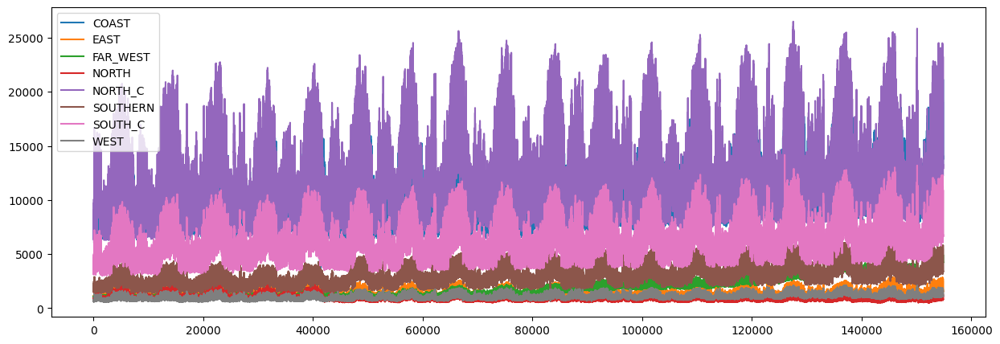

In [28]:
import pandas as pd

df = pd.read_csv(
    "https://github.com/ourownstory/neuralprophet-data/raw/main/datasets/multivariate/load_ercot_regions.csv"
)
fig = df.plot(figsize=(15, 5))

In [29]:
from neuralprophet import NeuralProphet, set_log_level

# Here we use the same dataset only preprocessed to match NeuralProphet's input format
df = pd.read_csv("https://github.com/ourownstory/neuralprophet-data/raw/main/datasets/multivariate/ercot-panel.csv")
df.head()

# Disable log messages below error
set_log_level("ERROR")

# Base model
m = NeuralProphet()
m.set_plotting_backend("plotly")
metrics = m.fit(df, freq="H")
forecast = m.predict(df)
m.plot(forecast, df_name="NORTH_C")

Finding best initial lr: 100%|██████████| 283/283 [00:01<00:00, 226.01it/s]


Predicting DataLoader 0: 100%|██████████| 26/26 [00:00<00:00, 188.09it/s]


We then define a second model which uses local modelling. This means each region is modelled separately for trend and seasonality.



In [30]:
m = NeuralProphet(
    trend_global_local="local",
    season_global_local="local",
)
m.set_plotting_backend("plotly")
metrics = m.fit(df, freq="H")
forecast = m.predict(df)
m.plot(forecast, df_name="NORTH_C")

Finding best initial lr: 100%|██████████| 283/283 [00:01<00:00, 192.72it/s]


Predicting DataLoader 0: 100%|██████████| 26/26 [00:00<00:00, 118.39it/s]
